In [1]:
import warnings
warnings.filterwarnings('ignore')

## 1. Datasets

In [2]:
%%capture
! pip install datasets

In [3]:
from datasets import load_dataset

dataset = load_dataset('poloclub/diffusiondb', '2m_first_1k', split='train')

README.md:   0%|          | 0.00/25.0k [00:00<?, ?B/s]

diffusiondb.py:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

The repository for poloclub/diffusiondb contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/poloclub/diffusiondb.
You can avoid this prompt in future by passing the argument `trust_remote_code=True`.

Do you wish to run the custom code? [y/N] y


part-000002.zip:   0%|          | 0.00/581M [00:00<?, ?B/s]

metadata.parquet:   0%|          | 0.00/195M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [4]:
example_index = 867
original_image = dataset[example_index]['image']
original_prompt = dataset[example_index]['prompt']
print(f'Prompt: {original_prompt}')

Prompt: cute fluffy baby cat rabbit lion hybrid mixed creature character concept, with long flowing mane blowing in the wind, long peacock feather tail, wearing headdress of tribal peacock feathers and flowers, detailed painting, renaissance, 4 k 


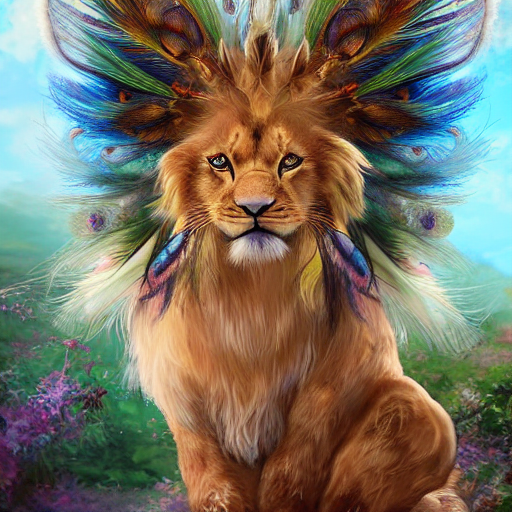

In [5]:
from PIL import Image
from IPython.display import display

display(original_image)

## 2. 이미지 변환

In [6]:
import os
import requests
import base64
from openai import OpenAI
from io import BytesIO

openai_api_key = ''
os.environ["OPENAI_API_KEY"] = openai_api_key
client = OpenAI()

def make_base64(image):
  buffered = BytesIO()
  image.save(buffered, format="JPEG")
  img_str = base64.b64encode(buffered.getvalue()).decode('utf-8')
  return img_str

def generate_description_from_image_gpt4(prompt, image64):
  headers = {
      "Cintent-Type": "application/json",
      "Authorization": f"Bearer {client.api_key}"
  }

  payload = {
      "model": "gpt-4o",
      "messages": [{
          "role": "user",
          "content": [
              {"type": "text", "text": prompt},
              {
                  "type": "image_url",
                  "image_url": {"url": f"data:image/jpeg;base64,{image64}"}
              }
          ]
      }],
      "max_tokens": 300
  }

  response_oai = requests.post(
      "https://api.openai.com/v1/chat/completions",
      headers=headers,
      json=payload
  )
  result = response_oai.json()['choices'][0]['message']['content']
  return result

In [7]:
image_base64 = make_base64(original_image)
gpt4_description = generate_description_from_image_gpt4("Describe provided image", image_base64)
gpt4_description

"The image depicts a lion with a vibrant, artistic twist. The lion features a mane that resembles colorful peacock feathers, creating a majestic and fantastical appearance. The background consists of a serene, natural setting with soft, blurry greenery and flowers, enhancing the ethereal quality of the scene. The combination of the lion's regal presence and the vibrant colors gives the image an otherworldly and imaginative feel."

## 3. 프롬프트 저장

In [8]:
%%capture
! pip install pinecone

In [9]:
from pinecone import Pinecone, ServerlessSpec

pinecone_api_key = ""

pc = Pinecone(api_key=pinecone_api_key)

pc.list_indexes()

[]

In [10]:
index_name = "llm-multimodal"
try:
  pc.create_index(
      name=index_name,
      dimension=512,
      metric="cosine",
      spec=ServerlessSpec("aws", "us-east-1")
  )
except:
  print("Index already exists")

index = pc.Index(index_name)

In [11]:
import torch
from tqdm.auto import trange
from torch.utils.data import DataLoader
from transformers import AutoTokenizer, CLIPTextModelWithProjection

device = 'cuda' if torch.cuda.is_available() else 'cpu'

text_model = CLIPTextModelWithProjection.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-base-patch32")

tokens = tokenizer(dataset['prompt'], return_tensors='pt', truncation=True, padding=True)
batch_size = 16

text_embs = []
for start_idx in trange(0, len(dataset), batch_size):
  with torch.no_grad():
    outputs = text_model(
        input_ids=tokens['input_ids'][start_idx:start_idx+batch_size],
        attention_mask=tokens['attention_mask'][start_idx:start_idx+batch_size]
    )
    text_emb_tmp = outputs.text_embeds
  text_embs.append(text_emb_tmp)
text_embs = torch.cat(text_embs, dim=0)
text_embs.shape

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

  0%|          | 0/63 [00:00<?, ?it/s]

torch.Size([1000, 512])

In [12]:
input_data = []
for id_int, emb, prompt in zip(range(0, len(dataset)), text_embs.tolist(), dataset['prompt']):
  input_data.append({
      'id': str(id_int),
      'values': emb,
      'metadata': {
          'prompt': prompt
      }
  })

  index.upsert(vectors=input_data)

## 4. 이미지 임베딩 검색

In [16]:
from transformers import AutoProcessor, CLIPVisionModelWithProjection

vision_model = CLIPVisionModelWithProjection.from_pretrained("openai/clip-vit-base-patch32")
processor = AutoProcessor.from_pretrained("openai/clip-vit-base-patch32")

inputs = processor(images=original_image, return_tensors='pt')

outputs = vision_model(**inputs)
image_embeds = outputs.image_embeds

search_results = index.query(
    vector=image_embeds[0].tolist(),
    top_k=3,
    include_values=False,
    include_metadata=True
)

search_results

{'matches': [{'id': '918',
              'metadata': {'prompt': 'cute fluffy bunny cat lion hybrid mixed '
                                     'creature character concept, with long '
                                     'flowing mane blowing in the wind, long '
                                     'peacock feather tail, wearing headdress '
                                     'of tribal peacock feathers and flowers, '
                                     'detailed painting, renaissance, 4 k '},
              'score': 0.372838497,
              'values': []},
             {'id': '867',
              'metadata': {'prompt': 'cute fluffy baby cat rabbit lion hybrid '
                                     'mixed creature character concept, with '
                                     'long flowing mane blowing in the wind, '
                                     'long peacock feather tail, wearing '
                                     'headdress of tribal peacock feathers and '
            

In [18]:
searched_idx = int(search_results['matches'][0]['id'])

searched_prompt = dataset[searched_idx]['prompt']
print(f'Searched prompt:\n {searched_prompt}')

Searched prompt:
 cute fluffy bunny cat lion hybrid mixed creature character concept, with long flowing mane blowing in the wind, long peacock feather tail, wearing headdress of tribal peacock feathers and flowers, detailed painting, renaissance, 4 k 


## 5. 이미지 생성

In [20]:
from PIL import Image

def generate_image_dalle3(prompt):
  response_oai = client.images.generate(
      model="dall-e-3",
      prompt=prompt,
      size="1024x1024",
      quality="standard",
      n=1,
  )
  result = response_oai.data[0].url
  return result

def get_generated_image(image_url):
  generated_image = requests.get(image_url).content
  image_filename = 'gen_img.png'
  with open(image_filename, 'wb') as image_file:
    image_file.write(generated_image)
  return Image.open(image_filename)

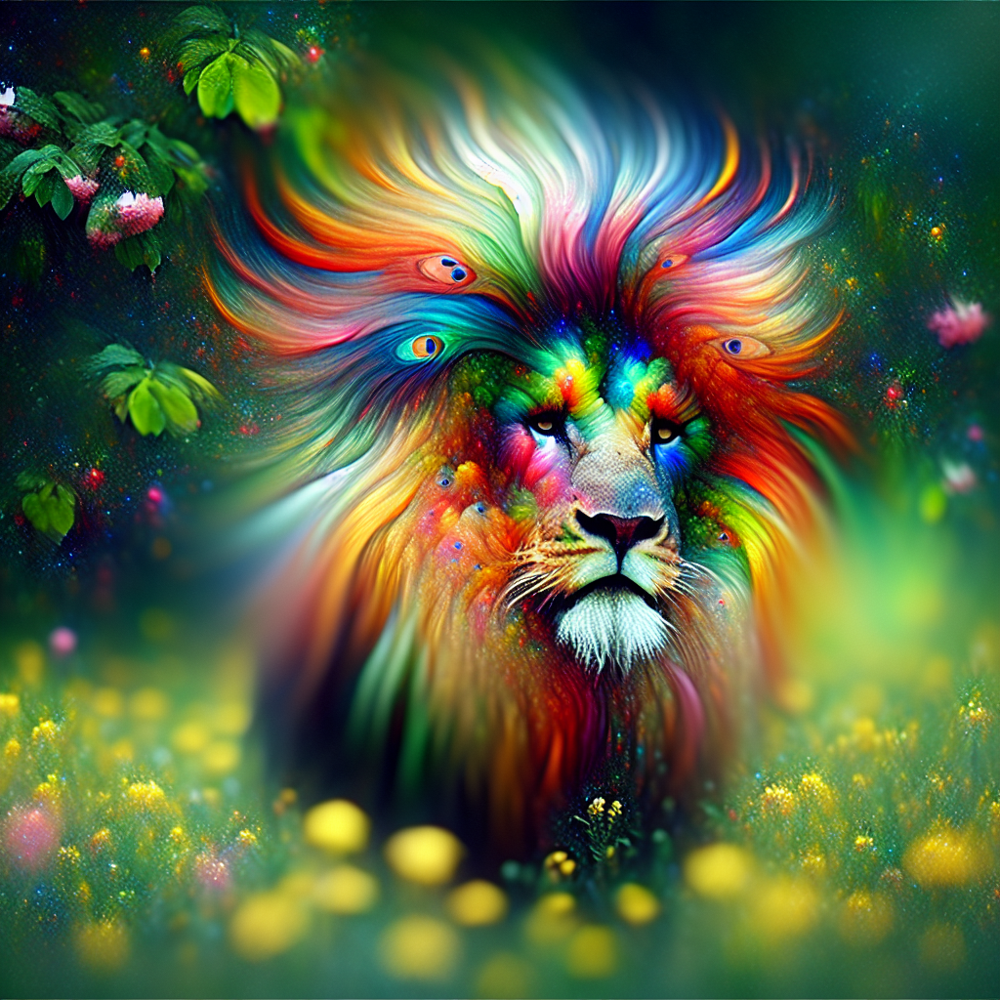

In [24]:
get_described_image_url = generate_image_dalle3(gpt4_description)
gpt4o_prompt_image = get_generated_image(get_described_image_url)
gpt4o_prompt_image

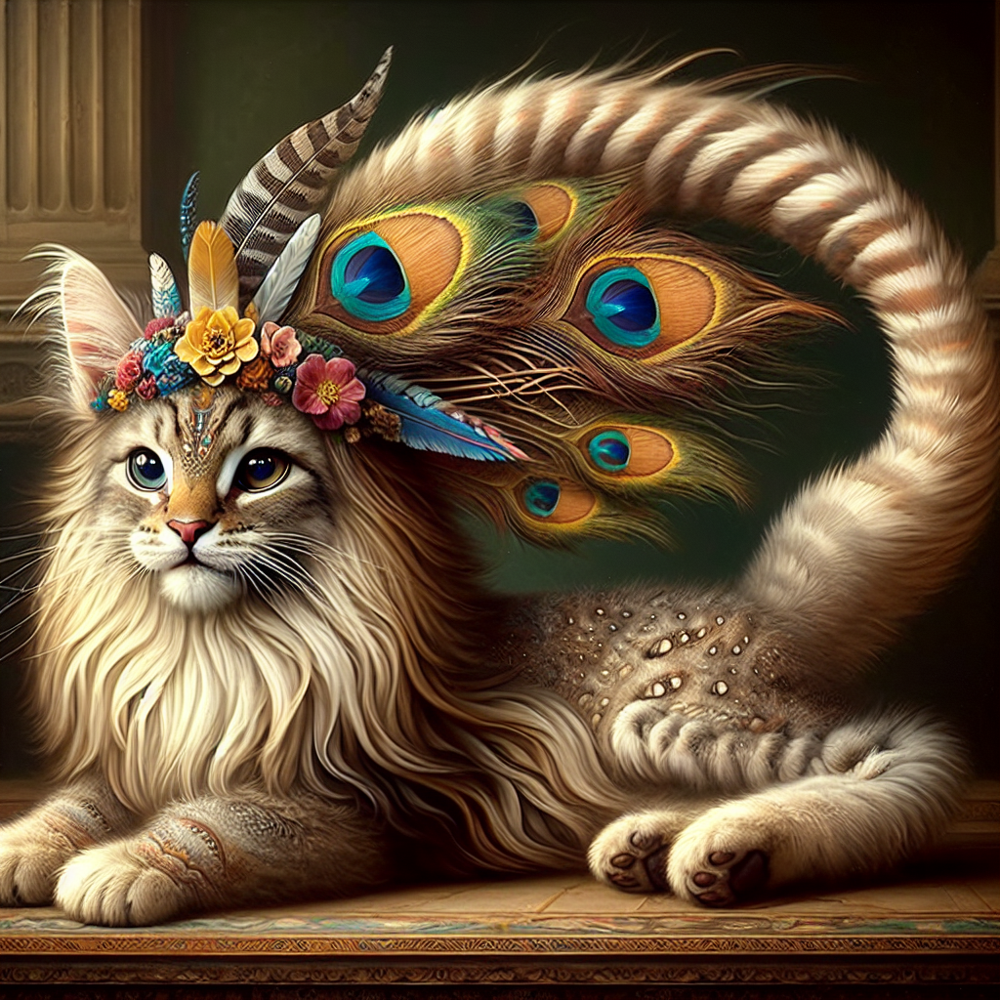

In [22]:
original_prompt_image_url = generate_image_dalle3(original_prompt)
original_prompt_image = get_generated_image(original_prompt_image_url)
original_prompt_image

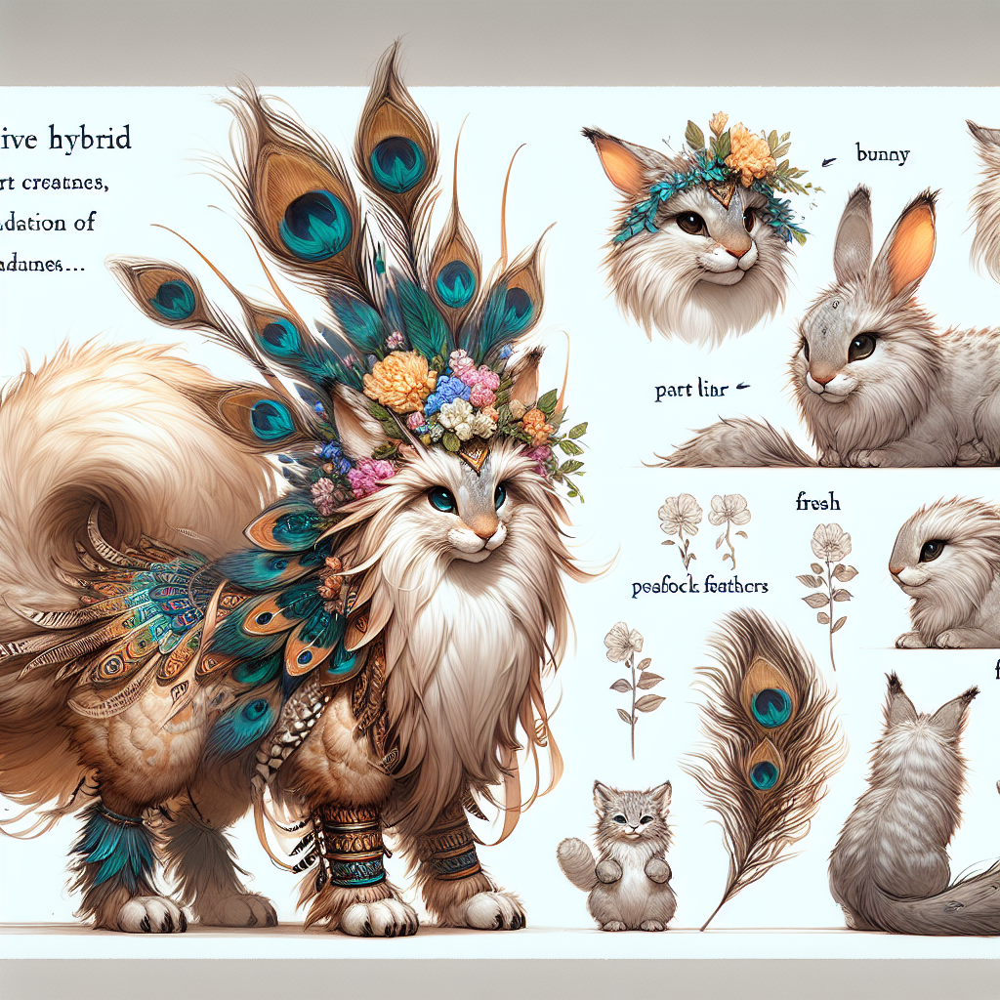

In [23]:
searched_prompt_image_url = generate_image_dalle3(searched_prompt)
searched_prompt_image = get_generated_image(searched_prompt_image_url)
searched_prompt_image

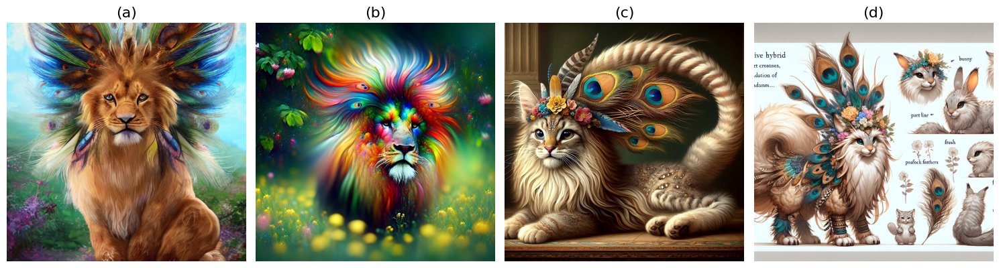

In [25]:
import matplotlib.pyplot as plt

images = [original_image, gpt4o_prompt_image, original_prompt_image, searched_prompt_image]
titles = ['(a)', '(b)', '(c)', '(d)']

fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
for ax, img, title in zip(axes, images, titles):
  ax.imshow(img)
  ax.axis('off')
  ax.set_title(title, fontsize=16)

plt.tight_layout()
plt.show()